In [48]:
!pip install torch pretty_midi matplotlib midi2audio librosa

In [49]:
# Cell 1: Imports
import os
import torch
import torch.nn as nn
import torch.optim as optim
import random
import numpy as np
from torch.utils.data import Dataset, DataLoader
import pretty_midi
import matplotlib.pyplot as plt
import pickle
import torch.nn.functional as F
import librosa
import librosa.display

from midi2audio import FluidSynth
from IPython.display import Audio, display

# Assignment 2 Music Generation

## Task 1: Symbolic Generation


In [50]:
# Import in dataset
import pickle

with open("JSB-Chorales-dataset-master/jsb-chorales-quarter.pkl", "rb") as f:
    data = pickle.load(f, encoding="latin1")

chorales = data["train"]  # You can also access 'valid' and 'test'

print(f"Loaded {len(chorales)} training chorales.")
print("Sample:", chorales[0][:5])


Loaded 229 training chorales.
Sample: [(np.int64(60), np.int64(72), np.int64(79), np.int64(88)), (np.int64(72), np.int64(79), np.int64(88)), (np.int64(67), np.int64(70), np.int64(76), np.int64(84)), (np.int64(69), np.int64(77), np.int64(86)), (np.int64(67), np.int64(70), np.int64(79), np.int64(88))]



### Dataset Context
The JSB Chorales dataset consists of 382 four-part harmonized chorales by J.S. Bach. It is widely used in symbolic music modeling and has been curated to support machine learning tasks. We use the version released by [Zhuang et al.](https://github.com/czhuang/JSB-Chorales-dataset), which contains quarter-note quantized sequences of chord events encoded as MIDI pitch tuples.

We selected the **soprano voice** to build a monophonic melody model using an LSTM.

### Preprocessing Steps
- Extract first pitch in each chord (soprano line)
- Remove silences/rests (`-1`)
- Build vocabulary of MIDI pitches
- Tokenize each melody to integer indices for model input




In [51]:
## Preprocess Dataset

# Extract the soprano (melody) line from each chorale
melody_seqs = []

for chorale in chorales:
    melody = []
    for chord in chorale:
        if isinstance(chord, (list, tuple)) and len(chord) > 0:
            note = chord[0]  # Soprano = first pitch in chord
            if note != -1:   # Skip rests
                melody.append(int(note))  # Convert np.int64 → int
    if len(melody) > 10:
        melody_seqs.append(melody)

print(f"Extracted {len(melody_seqs)} melody sequences.")
print("First melody sequence:", melody_seqs[0][:10])


Extracted 229 melody sequences.
First melody sequence: [60, 72, 67, 69, 67, 65, 65, 58, 69, 68]


In [52]:
## Build vocabulary of unique MIDI pitches/notes
## Then converts melody sequences into integer token sequences
## These sequences are fed into the NN


all_notes = sorted(set(n for seq in melody_seqs for n in seq)) # flattens list of melody sequences
note_to_idx = {note: i for i, note in enumerate(all_notes)} # maps each MIDI pitch to unique index
idx_to_note = {i: note for note, i in note_to_idx.items()} # reverse map from idx to MIDI pitch
vocab_size = len(note_to_idx)

# Convert melody sequences to tokenized integer sequences
# list of integers
tokenized_seqs = [[note_to_idx[n] for n in seq] for seq in melody_seqs]

print("Vocabulary size:", vocab_size)
print("Tokenized example:", tokenized_seqs[0][:10])


Vocabulary size: 38
Tokenized example: [14, 26, 21, 23, 21, 19, 19, 12, 23, 22]


In [53]:
## Create Dataset
# prepares data for LSTM model 
# takes tokenized melody sequences and splits into
# fixed-length input-output pairs
class MelodyDataset(Dataset):
    def __init__(self, token_seqs, seq_len=32):
        self.samples = []
        for seq in token_seqs:
            for i in range(len(seq) - seq_len):
                x = seq[i:i+seq_len]
                y = seq[i+1:i+seq_len+1]
                self.samples.append((x, y))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        x, y = self.samples[idx]
        return torch.tensor(x), torch.tensor(y)


In [54]:
# Set sequence length and batch size
seq_len = 32 # preicts input of 32 tokens and tries to predict 32 next notes
batch_size = 64 # process 64 input-output pairs at a time

# Create dataset and dataloader
dataset = MelodyDataset(tokenized_seqs, seq_len=seq_len)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

print(f"Total training sequences: {len(dataset)}")


Total training sequences: 6468


In [55]:
# Train Model

class MusicRNN(nn.Module):
    def __init__(self, vocab_size, embedding_dim=128, hidden_dim=256, num_layers=2, seq_len=32):
        super(MusicRNN, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.position_embed = nn.Embedding(seq_len, embedding_dim)

        self.lstm = nn.LSTM(
            input_size=embedding_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True
        )

        self.norm = nn.LayerNorm(hidden_dim)
        self.dropout = nn.Dropout(0.2)
        self.fc = nn.Linear(hidden_dim, vocab_size)

    def forward(self, x):
        batch_size, seq_len = x.size()
        positions = torch.arange(seq_len, device=x.device).unsqueeze(0).expand(batch_size, seq_len)

        x = self.embedding(x) + self.position_embed(positions)
        out, _ = self.lstm(x)
        out = self.norm(out)
        out = self.dropout(out)
        logits = self.fc(out)
        return logits


In [56]:
## Train
def train_rnn(model, dataloader, vocab_size, num_epochs=10, lr=0.001, device="cuda" if torch.cuda.is_available() else "cpu"):
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    loss_fn = nn.CrossEntropyLoss()

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for xb, yb in dataloader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()

            logits = model(xb)  # (batch_size, seq_len, vocab_size)
            loss = loss_fn(logits.view(-1, vocab_size), yb.view(-1))

            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / len(dataloader)
        print(f"Epoch {epoch+1}/{num_epochs} | Loss: {avg_loss:.4f}")



In [57]:
model = MusicRNN(vocab_size=vocab_size, seq_len=32)
train_rnn(model, dataloader, vocab_size, num_epochs=10)

Epoch 1/10 | Loss: 2.2410
Epoch 2/10 | Loss: 1.8021
Epoch 3/10 | Loss: 1.3406
Epoch 4/10 | Loss: 0.8480
Epoch 5/10 | Loss: 0.5652
Epoch 6/10 | Loss: 0.4409
Epoch 7/10 | Loss: 0.3749
Epoch 8/10 | Loss: 0.3359
Epoch 9/10 | Loss: 0.3129
Epoch 10/10 | Loss: 0.2983


In [58]:
# Sample to generate a new melody using LSTM model (starts off with prefix)
def sample_sequence(model, prefix, max_length=100, temperature=1.0, device="cuda" if torch.cuda.is_available() else "cpu"):
    model.eval()
    model = model.to(device)

    generated = prefix[:]
    input_seq = torch.tensor([prefix], device=device)

    for _ in range(max_length - len(prefix)):
        # Truncate input to most recent seq_len tokens
        input_trunc = input_seq[:, -model.position_embed.num_embeddings:]

        logits = model(input_trunc)
        logits = logits[:, -1, :] / temperature
        probs = F.softmax(logits, dim=-1)

        next_token = torch.multinomial(probs, num_samples=1).item()
        generated.append(next_token)

        input_seq = torch.tensor([generated], device=device)

    return generated


In [59]:
prefix = tokenized_seqs[0][:16]  # use the beginning of a real melody
generated_ids = sample_sequence(model, prefix, max_length=64, temperature=1.0)
generated_notes = [idx_to_note[i] for i in generated_ids]


In [60]:

# Use the full melody from the first sequence, or truncate to match the generated length
original_midi_notes = melody_seqs[0][:len(generated_notes)]  # Match lengths

# Save both to MIDI
def save_midi(note_seq, filename="output.mid", note_duration=0.5):
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=0)
    current_time = 0
    for pitch in note_seq:
        note = pretty_midi.Note(
            velocity=100,
            pitch=pitch,
            start=current_time,
            end=current_time + note_duration
        )
        instrument.notes.append(note)
        current_time += note_duration
    pm.instruments.append(instrument)
    pm.write(filename)

# Save original and generated melodies as MIDI
save_midi(original_midi_notes, "original.mid")
save_midi(generated_notes, "generated.mid")

# Convert to audio (requires FluidR3_GM.sf2 in the same directory)
fs = FluidSynth("FluidR3_GM.sf2")
fs.midi_to_audio("original.mid", "original.wav")
fs.midi_to_audio("generated.mid", "generated.wav")

# Display audio
print("🎵 Original melody:")
display(Audio("original.wav"))

print("🎶 Generated melody:")
display(Audio("generated.wav"))

FluidSynth runtime version 2.4.4
Copyright (C) 2000-2025 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'original.wav'..
FluidSynth runtime version 2.4.4
Copyright (C) 2000-2025 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of Creative Technology Ltd.

Rendering audio to file 'generated.wav'..
🎵 Original melody:


🎶 Generated melody:


In [61]:
def extract_midi_pitches(midi_file):
    midi_data = pretty_midi.PrettyMIDI(midi_file)
    pitches = []
    for note in midi_data.instruments[0].notes:
        pitches.append((note.start, note.pitch))
    # Sort by start time and return pitch only
    pitches.sort()
    return [p[1] for p in pitches]

def extract_pitch_from_wav(wav_file):
    y, sr = librosa.load(wav_file)
    pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
    pitch_track = []
    for i in range(pitches.shape[1]):
        index = magnitudes[:, i].argmax()
        pitch = pitches[index, i]
        pitch_track.append(pitch if pitch > 0 else np.nan)
    # Convert Hz to MIDI pitch (round)
    midi_pitches = [int(round(librosa.hz_to_midi(p))) if not np.isnan(p) else np.nan for p in pitch_track]
    return midi_pitches

def plot_melodies_from_files(file1, file2, title="Melody Comparison"):
    def load_pitches(file):
        ext = os.path.splitext(file)[1].lower()
        if ext == ".mid":
            return extract_midi_pitches(file)
        elif ext == ".wav":
            return extract_pitch_from_wav(file)
        else:
            raise ValueError(f"Unsupported file type: {file}")

    melody1 = load_pitches(file1)
    melody2 = load_pitches(file2)
    min_len = min(len(melody1), len(melody2))

    plt.figure(figsize=(12, 6))

    # Plot file 1
    plt.subplot(2, 1, 1)
    plt.plot(melody1[:min_len], marker='o')
    plt.title(f"Melody from {file1}")
    plt.ylabel("MIDI Pitch")
    plt.xticks(range(min_len))
    plt.grid(True, linestyle='--', alpha=0.5)

    # Plot file 2
    plt.subplot(2, 1, 2)
    plt.plot(melody2[:min_len], marker='o', color='orange')
    plt.title(f"Melody from {file2}")
    plt.xlabel("Time Step")
    plt.ylabel("MIDI Pitch")
    plt.xticks(range(min_len))
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()


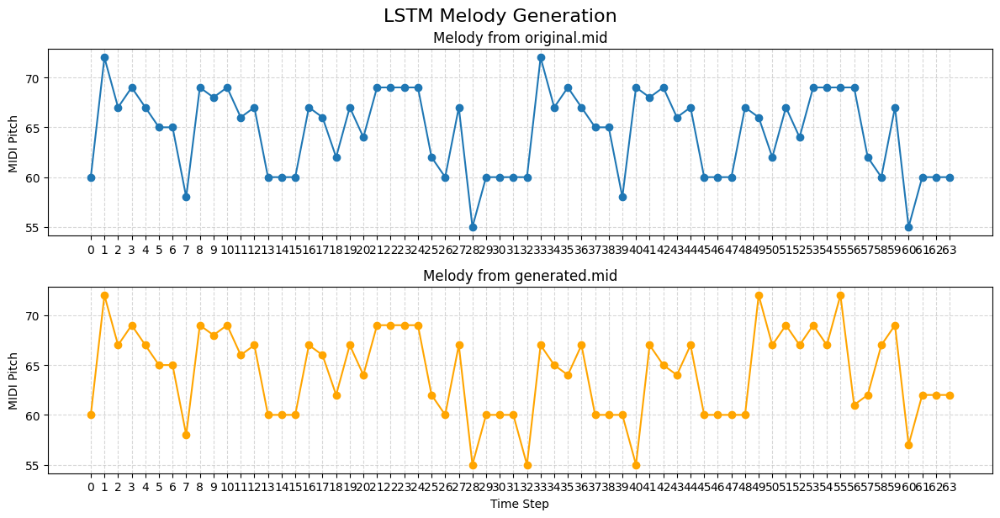

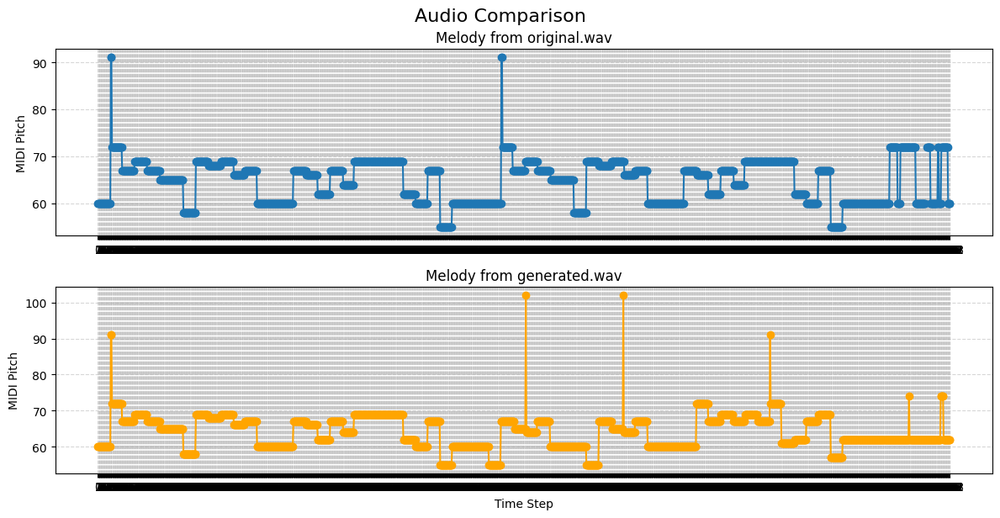

In [46]:
plot_melodies_from_files("original.mid", "generated.mid", title="LSTM Melody Generation")
plot_melodies_from_files("original.wav", "generated.wav", title="Audio Comparison")


### Evaluation